# Automatic Speech Recognition

### Loading Libraries

In [ ]:
import os
import sys
from os.path import exists, join, basename, splitext
from IPython.display import YouTubeVideo

In [ ]:
!pip install -q youtube-dl librosa python_speech_features sentencepiece
!pip install jiwer
import jiwer

### Loading Data

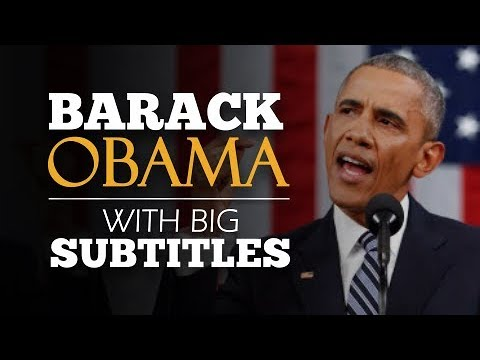

In [ ]:
# Get the YouTube Video
YOUTUBE_ID = 'mi8N5gDVpeg'
YouTubeVideo(YOUTUBE_ID)

In [ ]:
# Download, extract audio and convert to wav
!rm -rf *.wav
!youtube-dl --extract-audio --audio-format wav --output "test.%(ext)s" https://www.youtube.com/watch\?v\={YOUTUBE_ID}

[youtube] mi8N5gDVpeg: Downloading webpage
[download] Destination: test.webm
[download] 100% of 4.68MiB in 00:00
[ffmpeg] Destination: test.wav
Deleting original file test.webm (pass -k to keep)


In [ ]:
!ffmpeg -i test.wav -ss 00:00:11 -to 00:01:11 -c copy test2.wav

ffmpeg version 3.4.6-0ubuntu0.18.04.1 Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.3.0-16ubuntu3)
  configuration: --prefix=/usr --extra-version=0ubuntu0.18.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --ena

In [ ]:
import IPython
IPython.display.Audio("test2.wav")

In [ ]:
ground_truth = '''we didn't start with much money or many endorsements. 
our campaign was not hatched in the halls of washington.
it began in the backyards of des moines.
and the living rooms of concord and the front porches of charleston.
it was built by working men and women who dug into what little savings they had
to give five dollars and ten dollars and twenty dollars to the cause.
it grew strength from the young people who rejected the myth of their generations' 
apathy. who left their homes and their families for jobs that offered little pay
and less sleep. it drew strength from the not so young people who braved the bitter
cold and scorching heat to knock on doors of perfect strangers. and from the
millions of americans who volunteered and organized and proved that more than 
two centuries later a government of the people by the people and for the people
has not perished from the earth.'''

### DeepSpeech

In [ ]:
# Install DeepSpeech
if not exists('deepspeech-0.6.1-models'):
  !apt-get install -qq sox
  !pip install -q deepspeech-gpu==0.6.1 youtube-dl
  !wget https://github.com/mozilla/DeepSpeech/releases/download/v0.6.1/deepspeech-0.6.1-models.tar.gz
  !tar xvfz deepspeech-0.6.1-models.tar.gz

In [ ]:
!deepspeech --model deepspeech-0.6.1-models/output_graph.pbmm --lm deepspeech-0.6.1-models/lm.binary --trie deepspeech-0.6.1-models/trie --audio test2.wav

Loading model from file deepspeech-0.6.1-models/output_graph.pbmm
TensorFlow: v1.14.0-21-ge77504a
DeepSpeech: v0.6.1-0-g3df20fe
2020-04-23 12:52:17.666078: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2020-04-23 12:52:17.670574: I tensorflow/stream_executor/platform/default/dso_loader.cc:42] Successfully opened dynamic library libcuda.so.1
2020-04-23 12:52:17.705373: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1005] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-04-23 12:52:17.705965: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1640] Found device 0 with properties: 
name: Tesla T4 major: 7 minor: 5 memoryClockRate(GHz): 1.59
pciBusID: 0000:00:04.0
2020-04-23 12:52:17.705984: I tensorflow/stream_executor/platform/default/dlopen_checker_stub.cc:25] GPU libraries are statical

In [ ]:
transcription_deepspeech = '''we don't say but much money or many norse our 
campaign was not had in the hall at washington and began in the back yards of 
the boy the livin rooms have continent porch is of charles i was bellamy 
wortman and women who dug and to what little savings had to give five dollars 
ten dollars and twenty dollars sadako it grew strained from the young people 
over jeered at their generation at the letter home and their families for jobs 
that offer little pay and less play iteratum the nut so young people who breathe 
better cold and scorching heat on not on door the furbishing and from the millions 
of americans a volunteer and organize and from bear than two centuries later a 
government of the people by the people and for the people had not paris from '''

In [ ]:
measures = jiwer.compute_measures(ground_truth, transcription_deepspeech)
print(measures['wer'])
print(measures['mer'])
print(measures['wil'])

35.0
0.9929078014184397
0.99822695035461


### Wave2Letter+

In [ ]:
# Install Wave2Letter+
%tensorflow_version 1.x
git_repo_url = 'https://github.com/NVIDIA/OpenSeq2Seq.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # clone and install dependencies
  !git clone -q --depth 1 {git_repo_url}
  !git checkout e958b7d
  !pip uninstall -y -q pymc3
  !pip install --upgrade joblib
  #!cd {project_name} && pip install -q -r requirements.txt
  !pip install -q youtube-dl librosa python_speech_features sentencepiece
  
  # create eval config
  !cp {project_name}/example_configs/speech2text/w2lplus_large_8gpus_mp.py {project_name}/conf.py
  !sed -i -e 's/data\/librispeech\/librivox-test-clean/test/' {project_name}/conf.py
  !sed -i -e 's/# "use_lang/"use_lang/' {project_name}/conf.py
  !echo 'backend = "librosa"' >> {project_name}/conf.py 
  #!cat {project_name}/conf.py
  !echo "wav_filename, wav_filesize, transcript" > {project_name}/test.csv
  !echo "test.wav, UNUSED, UNUSED" >> {project_name}/test.csv

sys.path.append(project_name)

# Download pre-trained weights
def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}
  
if not exists(join(project_name, 'w2l_log_folder')):
  download_from_google_drive('10EYe040qVW6cfygSZz6HwGQDylahQNSa', 'w2l_plus_large.tar')
  !tar xf w2l_plus_large.tar
  !mv w2l_plus_large {project_name}/w2l_log_folder

TensorFlow 1.x selected.


In [ ]:
# !ffmpeg -loglevel panic -y -i downloaded.wav -acodec pcm_s16le -ac 1 -ar 16000 $project_name/test.wav
!ffmpeg -i test2.wav -ar 16000 $project_name/test.wav
!cd {project_name} && python run.py --config_file conf.py --mode=infer --infer_output_file=output.txt --use_horovod=False --num_gpus=1 --batch_size_per_gpu 1

In [ ]:
!tail -n1 {project_name}/output.txt

tail: cannot open 'OpenSeq2Seq/output.txt' for reading: No such file or directory


### Jasper

In [ ]:
# Installing Jasper
%tensorflow_version 1.x
git_repo_url = 'https://github.com/NVIDIA/OpenSeq2Seq.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # clone and install dependencies
  !git clone -q --depth 1 {git_repo_url}
  !git checkout e958b7d
  !pip uninstall -y -q pymc3
  !pip install --upgrade joblib
  #!cd {project_name} && pip install -q -r requirements.txt
  !pip install -q youtube-dl librosa python_speech_features sentencepiece
  
  # create eval config
  !cp {project_name}/example_configs/speech2text/jasper10x5_LibriSpeech_nvgrad.py {project_name}/conf.py
  !sed -i -e 's/\/data\/librispeech\/librivox-test-clean/test/' {project_name}/conf.py
  #!sed -i -e 's/# "use_lang/"use_lang/' {project_name}/conf.py
  !echo 'backend = "librosa"' >> {project_name}/conf.py 
  #!cat {project_name}/conf.py
  !echo "wav_filename, wav_filesize, transcript" > {project_name}/test.csv
  !echo "test.wav, UNUSED, UNUSED" >> {project_name}/test.csv

# Download pretrained weights
def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}
  
if not exists(join(project_name, 'w2l_log_folder')):
  download_from_google_drive('1gzGT8HoVNKY1i5HNQTKaSoCu7JHV4siR', 'jasper_10x5_dr_sp_nvgrad.zip')
  !unzip jasper_10x5_dr_sp_nvgrad.zip
  !mv checkpoint {project_name}/jasper_log_folder

In [ ]:
#!ffmpeg -loglevel panic -y -i downloaded.wav -acodec pcm_s16le -ac 1 -ar 16000 {project_name}/test.wav
!ffmpeg -i test2.wav -ar 16000 $project_name/test.wav
!cd {project_name} && python run.py --config_file conf.py --mode=infer --infer_output_file=output.txt --use_horovod=False --num_gpus=1 --batch_size_per_gpu 1

In [ ]:
!tail -n1 {project_name}/output.txt

tail: cannot open 'OpenSeq2Seq/output.txt' for reading: No such file or directory


### QuartzNet

In [ ]:
# Installing QuartzNet
!pip -q install wget youtube-dl wget tensorboardX kaldi-io marshmallow num2words ruamel.yaml soundfile sox torch-stft unidecode
!pip install -q nemo-toolkit==0.9.0 nemo-asr==0.9.0 #--no-deps

# we need also Apex
if not exists('apex'):
  !git clone -q --depth 1 https://github.com/NVIDIA/apex
  !cd apex && pip install -q --no-cache-dir ./

# Download pre-trained weights
if not exists('quartznet15x5_multidataset'):
  # download the pretrained weights
  !wget -nc -q --show-progress -O quartznet15x5.zip https://api.ngc.nvidia.com/v2/models/nvidia/multidataset_quartznet15x5/versions/1/zip
  !unzip quartznet15x5.zip && mkdir quartznet15x5_multidataset && mv Jasper* quartznet15x5.yaml quartznet15x5_multidataset


# Install
import json
from ruamel.yaml import YAML
import nemo
import nemo_asr

WORK_DIR = "/content/quartznet15x5_multidataset"
MODEL_YAML = "/content/quartznet15x5_multidataset/quartznet15x5.yaml"
CHECKPOINT_ENCODER = "/content/quartznet15x5_multidataset/JasperEncoder-STEP-243800.pt"
CHECKPOINT_DECODER = "/content/quartznet15x5_multidataset/JasperDecoderForCTC-STEP-243800.pt"
# Set this to True to enable beam search decoder
ENABLE_NGRAM = False
# This is only necessary if ENABLE_NGRAM = True. Otherwise, set to empty string
LM_PATH = "<PATH_TO_KENLM_BINARY>"

# Read model YAML
yaml = YAML(typ="safe")
with open(MODEL_YAML) as f:
    jasper_model_definition = yaml.load(f)
labels = jasper_model_definition['labels']

# Instantiate necessary Neural Modules
# Note that data layer is missing from here
neural_factory = nemo.core.NeuralModuleFactory(
    placement=nemo.core.DeviceType.GPU,
    backend=nemo.core.Backend.PyTorch)
data_preprocessor = nemo_asr.AudioToMelSpectrogramPreprocessor(factory=neural_factory)
jasper_encoder = nemo_asr.JasperEncoder(
    jasper=jasper_model_definition['JasperEncoder']['jasper'],
    activation=jasper_model_definition['JasperEncoder']['activation'],
    feat_in=jasper_model_definition['AudioToMelSpectrogramPreprocessor']['features'])
jasper_encoder.restore_from(CHECKPOINT_ENCODER, local_rank=0)
jasper_decoder = nemo_asr.JasperDecoderForCTC(
    feat_in=1024,
    num_classes=len(labels))
jasper_decoder.restore_from(CHECKPOINT_DECODER, local_rank=0)
greedy_decoder = nemo_asr.GreedyCTCDecoder()

def wav_to_text(manifest, greedy=True):
    from ruamel.yaml import YAML
    yaml = YAML(typ="safe")
    with open(MODEL_YAML) as f:
        jasper_model_definition = yaml.load(f)
    labels = jasper_model_definition['labels']

    # Instantiate necessary neural modules
    data_layer = nemo_asr.AudioToTextDataLayer(
        shuffle=False,
        manifest_filepath=manifest,
        labels=labels, batch_size=1)

    # Define inference DAG
    audio_signal, audio_signal_len, _, _ = data_layer()
    processed_signal, processed_signal_len = data_preprocessor(
        input_signal=audio_signal,
        length=audio_signal_len)
    encoded, encoded_len = jasper_encoder(audio_signal=processed_signal,
                                          length=processed_signal_len)
    log_probs = jasper_decoder(encoder_output=encoded)
    predictions = greedy_decoder(log_probs=log_probs)

    if ENABLE_NGRAM:
        print('Running with beam search')
        beam_predictions = beam_search_with_lm(
            log_probs=log_probs, log_probs_length=encoded_len)
        eval_tensors = [beam_predictions]

    if greedy:
        eval_tensors = [predictions]

    tensors = neural_factory.infer(tensors=eval_tensors)
    if greedy:
        from nemo_asr.helpers import post_process_predictions
        prediction = post_process_predictions(tensors[0], labels)
    else:
        prediction = tensors[0][0][0][0][1]
    return prediction

def create_manifest(file_path):
    # create manifest
    manifest = dict()
    manifest['audio_filepath'] = file_path
    manifest['duration'] = 18000
    manifest['text'] = 'todo'
    with open(file_path+".json", 'w') as fout:
        fout.write(json.dumps(manifest))
    return file_path+".json"

In [ ]:
!ffmpeg -loglevel panic -y -i downloaded.wav -acodec pcm_s16le -ac 1 -ar 16000 test.wav

transcription = wav_to_text(create_manifest('test.wav'))

print('\n\n')
print(transcription)